# Problem Statement:
---
Here we have information about the cars like their weight, make, mpg in the city, ..etc and we want to predict the price of those used cars.

Following is the dataset:
https://www.kaggle.com/datasets/ljanjughazyan/cars1

# Importing The Libraries:
---

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling
import warnings
import plotly.express as px
warnings.filterwarnings('ignore')

# Loading The Dataset:
---

In [2]:
df = pd.read_csv('cars_data.csv')

# Exploratory Data Analysis:
---
First let me generate a report for everything to see a high level view of the problem , then explore the dataset more on certain things.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 428 entries, 0 to 427
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Make         428 non-null    object 
 1   Model        428 non-null    object 
 2   Type         428 non-null    object 
 3   Origin       428 non-null    object 
 4   DriveTrain   428 non-null    object 
 5   MSRP         428 non-null    object 
 6   Invoice      428 non-null    object 
 7   EngineSize   428 non-null    float64
 8   Cylinders    426 non-null    float64
 9   Horsepower   428 non-null    int64  
 10  MPG_City     428 non-null    int64  
 11  MPG_Highway  428 non-null    int64  
 12  Weight       428 non-null    int64  
 13  Wheelbase    428 non-null    int64  
 14  Length       428 non-null    int64  
dtypes: float64(2), int64(6), object(7)
memory usage: 50.3+ KB


* The above summary misclassified the MSRP and the Invoice  columns as categorical variables when they're actually numeric, and that happened because they're of object type, so let's convert them to integers:

In [4]:
# Dealing with the two missing values:
df.isnull().sum()

Make           0
Model          0
Type           0
Origin         0
DriveTrain     0
MSRP           0
Invoice        0
EngineSize     0
Cylinders      2
Horsepower     0
MPG_City       0
MPG_Highway    0
Weight         0
Wheelbase      0
Length         0
dtype: int64

In [5]:
# Since there is only two missing values, droping them will make no difference:
df = df.dropna()

In [6]:
df.isnull().sum()

Make           0
Model          0
Type           0
Origin         0
DriveTrain     0
MSRP           0
Invoice        0
EngineSize     0
Cylinders      0
Horsepower     0
MPG_City       0
MPG_Highway    0
Weight         0
Wheelbase      0
Length         0
dtype: int64

In [7]:
# Convert MSRP and Invoice datatype to integer so we need to remove $ sign and comma (,) from these 2 columns

df['MSRP'] = df.MSRP.str.replace("$", "")
df['MSRP'] = df.MSRP.str.replace(",", "")
df['MSRP'] = df.MSRP.astype(int)

df['Invoice'] = df.Invoice.str.replace("$", "")
df['Invoice'] = df.Invoice.str.replace(",", "")
df['Invoice'] = df.Invoice.astype(int)

In [8]:
df.head()

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
0,Acura,MDX,SUV,Asia,All,36945,33337,3.5,6.0,265,17,23,4451,106,189
1,Acura,RSX Type S 2dr,Sedan,Asia,Front,23820,21761,2.0,4.0,200,24,31,2778,101,172
2,Acura,TSX 4dr,Sedan,Asia,Front,26990,24647,2.4,4.0,200,22,29,3230,105,183
3,Acura,TL 4dr,Sedan,Asia,Front,33195,30299,3.2,6.0,270,20,28,3575,108,186
4,Acura,3.5 RL 4dr,Sedan,Asia,Front,43755,39014,3.5,6.0,225,18,24,3880,115,197


In [9]:
# Generating a full report:
df.profile_report(title='Data Report')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

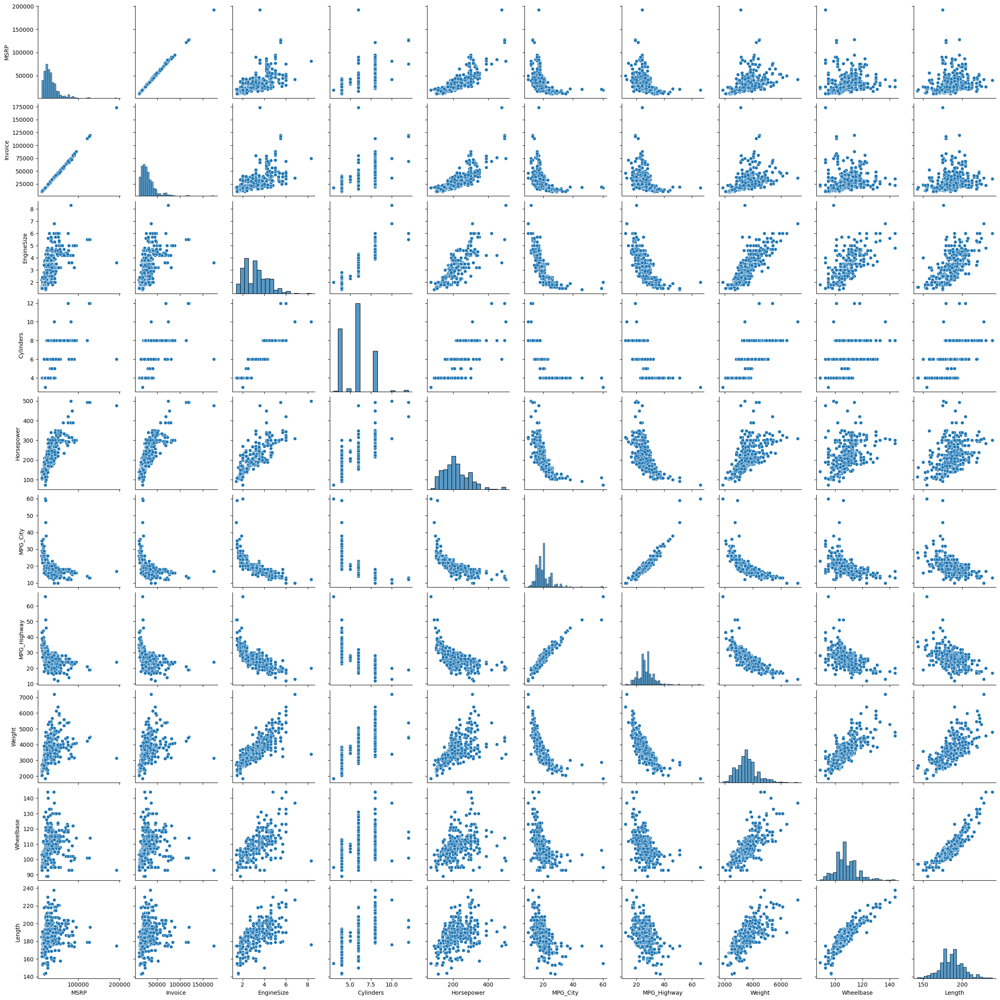

In [10]:
# Generating a pairplot to see all the relations in one place:
sns.pairplot(df)
plt.savefig('features.png')

In [11]:
df.Make.nunique()

38

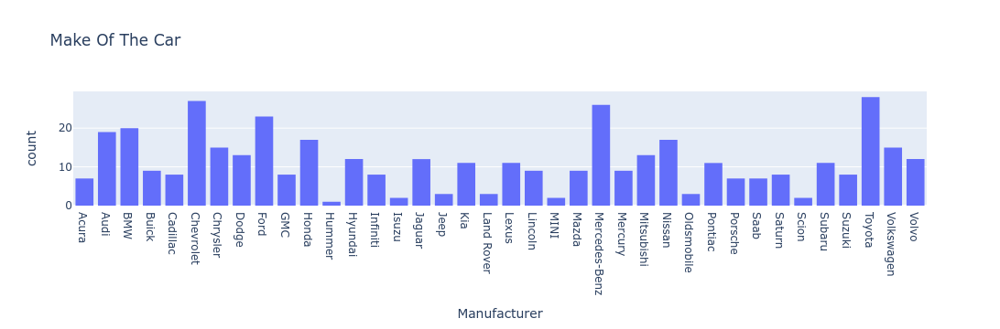

In [12]:
px.histogram(df, x='Make',
                   labels={'Make':'Manufacturer'},
                   title='Make Of The Car'
                   )

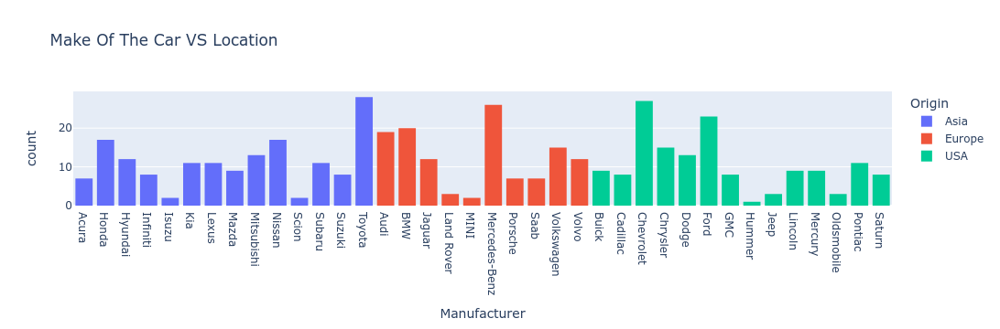

In [13]:
px.histogram(df, x='Make',
             color='Origin',
             labels = {'Make':'Manufacturer'},
             title = 'Make Of The Car VS Location'
             )

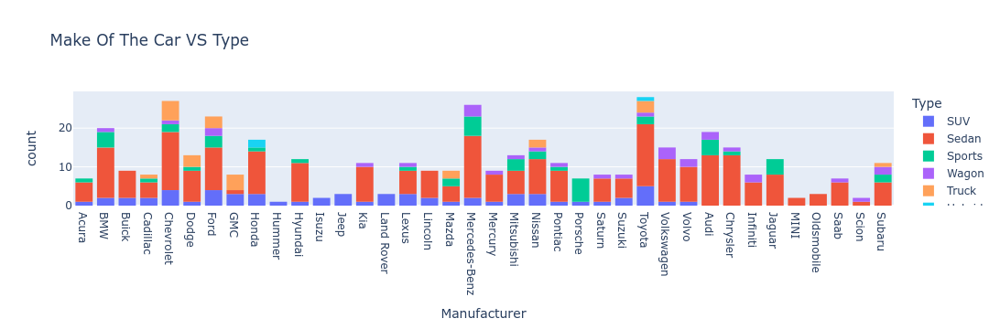

In [14]:
px.histogram(df, x='Make',
             color='Type',
             labels = {'Make':'Manufacturer'},
             title = 'Make Of The Car VS Type'
             )

* Note that one plot like the can answer many questions like which manufacturers produce hyprids or which one produces the most sports cars,..etc.

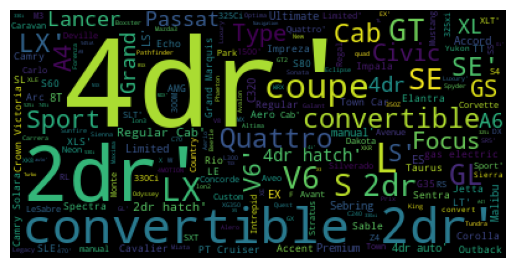

In [15]:
# Let's view the model of all used cars using WordCloud generator:
from wordcloud import WordCloud, STOPWORDS
wc = WordCloud(stopwords=STOPWORDS).generate(str(df.Model.values))
plt.axis('off')
plt.imshow(wc)

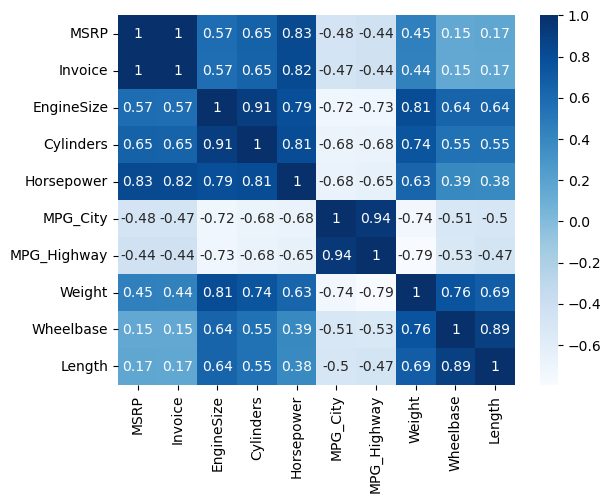

In [16]:
# Obtaining the correlation matrix with the values:
sns.heatmap(df.corr(), annot=True, cmap='Blues')
plt.savefig('corr.png')

# Preparing The Data Before Training:
---

In [17]:
# Performing one hot encoding for the categorical variables:
df_dummies = pd.get_dummies(df, 
                            columns=['Make', 'Model', 'Type', 'Origin', 'DriveTrain']
                            )
df_dummies.head()

,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length,...,Type_Sedan,Type_Sports,Type_Truck,Type_Wagon,Origin_Asia,Origin_Europe,Origin_USA,DriveTrain_All,DriveTrain_Front,DriveTrain_Rear
0,36945,33337,3.5,6.0,265,17,23,4451,106,189,...,0,0,0,0,1,0,0,1,0,0
1,23820,21761,2.0,4.0,200,24,31,2778,101,172,...,1,0,0,0,1,0,0,0,1,0
2,26990,24647,2.4,4.0,200,22,29,3230,105,183,...,1,0,0,0,1,0,0,0,1,0
3,33195,30299,3.2,6.0,270,20,28,3575,108,186,...,1,0,0,0,1,0,0,0,1,0
4,43755,39014,3.5,6.0,225,18,24,3880,115,197,...,1,0,0,0,1,0,0,0,1,0


In [18]:
# Dropping the Invoice  columnm since it is sort of redundant because of the very strong similarity with the MSRP column:
df = df_dummies.drop(columns='Invoice')

In [19]:
x = df.loc[:, df.columns != 'MSRP']
y = df.MSRP

In [20]:
x = np.array(x)
y = np.array(y)

In [21]:
# splitting the data into training/testing (80/20):
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2, random_state=10)

# https://stats.stackexchange.com/questions/554599/changing-the-random-state-for-the-data-split-results-in-a-changed-auc-for-my-ran

In [22]:
#cecking the shapes:
print(f'x_train shape: {x_train.shape}')
print(f'x_test shape: {x_test.shape}')
print(f'y_train shape: {y_train.shape}')
print(f'y_test shape: {y_test.shape}')

x_train shape: (340, 481)
x_test shape: (86, 481)
y_train shape: (340,)
y_test shape: (86,)


# Multiple Linear Regression:
---

In [23]:
from sklearn.linear_model import LinearRegression
lr_model = LinearRegression()
lr_model.fit(x_train, y_train)
lr_model.score(x_test,y_test)

0.839592342808901

# Decision Trees:
---

In [24]:
from sklearn.tree import DecisionTreeRegressor
dt_model = DecisionTreeRegressor()
dt_model.fit(x_train, y_train)
dt_model.score(x_test, y_test)

0.7082411576127525

# Random Forest:
---

In [25]:
from sklearn.ensemble import RandomForestRegressor
rf_model = RandomForestRegressor(n_estimators=10, max_depth=10)
rf_model.fit(x_train, y_train)
rf_model.score(x_test,y_test)

0.6929954818085908

# XGBoost:
****

In [26]:
from xgboost import XGBRegressor

In [27]:
xgb_model = XGBRegressor(learning_rate=0.4)
xgb_model.fit(x_train, y_train)
xgb_model.score(x_test, y_test)

0.8322280349078559

# Evaluating The Models Using Various KPIs:
***

In [28]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1. Linear Regression: 

MSE: 60707703.32015387 
MAE: 5053.827915221396 
r2: 0.7793016523116265


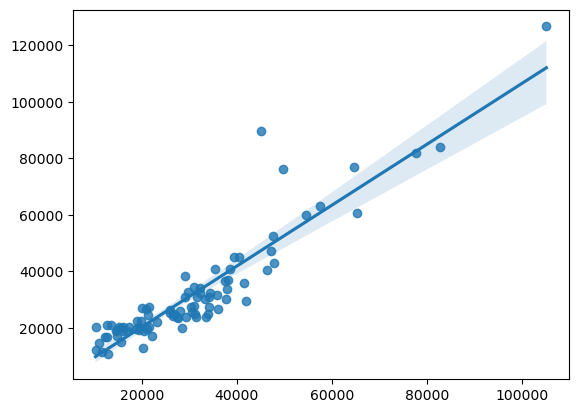

In [29]:
linear_regression = lr_model.predict(x_test)
sns.regplot(linear_regression, y_test)
MAE = mean_absolute_error(linear_regression,y_test)
MSE = mean_squared_error(linear_regression,y_test)
r2 = r2_score(linear_regression,y_test)
print('MSE:', MSE, '\nMAE:', MAE, '\nr2:', r2) 

# 2. Decision Trees: 

MSE: 110418726.60465117 
MAE: 5722.186046511628 
r2: 0.7139923230157215


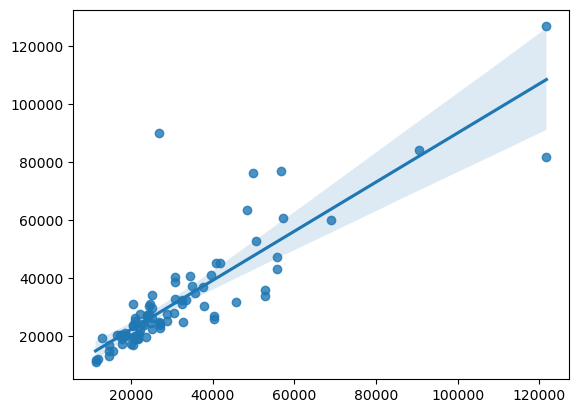

In [30]:
decision_tree = dt_model.predict(x_test)
sns.regplot(decision_tree, y_test)
MAE = mean_absolute_error(decision_tree,y_test)
MSE = mean_squared_error(decision_tree,y_test)
r2 = r2_score(decision_tree,y_test)
print('MSE:', MSE, '\nMAE:', MAE, '\nr2:', r2) 

# 3. Random Forest:

MSE: 116188588.09281985 
MAE: 5560.778546663224 
r2: 0.712769331527754


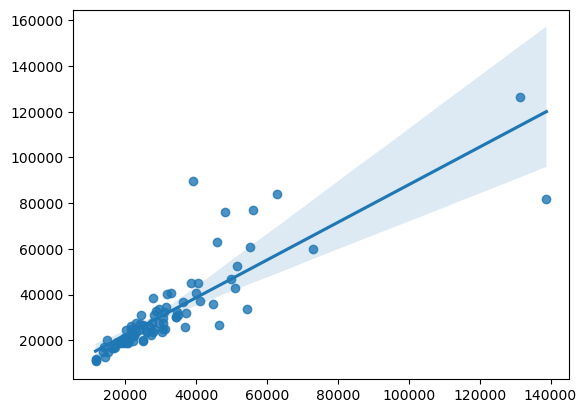

In [31]:
rf = rf_model.predict(x_test)
sns.regplot(rf, y_test)
MAE = mean_absolute_error(rf,y_test)
MSE = mean_squared_error(rf,y_test)
r2 = r2_score(rf,y_test)
print('MSE:', MSE, '\nMAE:', MAE, '\nr2:', r2) 

# 4. XGBoost:

MSE: 63494791.08792986 
MAE: 4370.471316315407 
r2: 0.7935334614848363


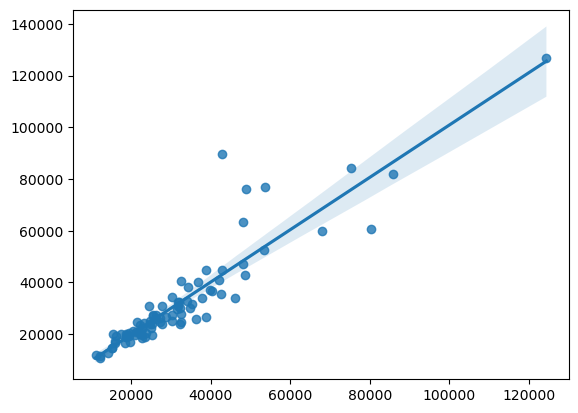

In [32]:
xgb = xgb_model.predict(x_test)
sns.regplot(xgb, y_test)
MAE = mean_absolute_error(xgb,y_test)
MSE = mean_squared_error(xgb,y_test)
r2 = r2_score(xgb,y_test)
print('MSE:', MSE, '\nMAE:', MAE, '\nr2:', r2) 

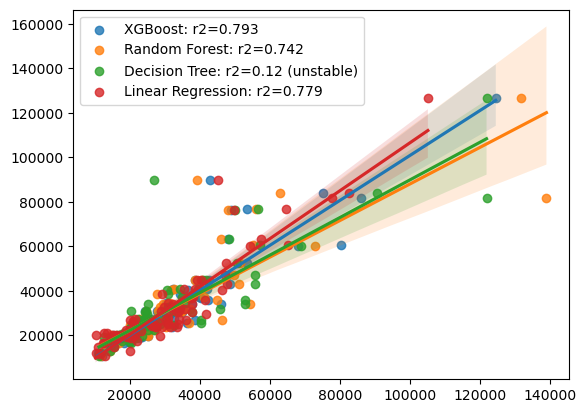

In [33]:
sns.regplot(xgb, y_test, label='XGBoost: r2=0.793')
sns.regplot(rf, y_test, label='Random Forest: r2=0.742')
sns.regplot(decision_tree, y_test, label='Decision Tree: r2=0.12 (unstable)')
sns.regplot(linear_regression, y_test, label='Linear Regression: r2=0.779')
plt.legend()
plt.savefig('TheFittedLines.png')